In [1]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import DataLoader, Dataset, Subset
from torch.utils.tensorboard import SummaryWriter
from torchinfo import summary
from safetensors.torch import save_model, load_model


In [2]:
batch_size = 256
figsize = 16

In [3]:
transform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
])

train_dataset = torchvision.datasets.CelebA(
    root='./data',  # Directory where the dataset will be saved
    split='train',  # Choose 'train', 'valid', or 'test'
    target_type='attr',  # Attributes to download
    transform=transform,  # Transform to apply to images
    download=True  # Download the dataset if not already present
)

test_dataset = torchvision.datasets.CelebA(
    root='./data',  # Directory where the dataset will be saved
    split='test',  # Choose 'train', 'valid', or 'test'
    target_type='attr',  # Attributes to download
    transform=transform,  # Transform to apply to images
    download=True  # Download the dataset if not already present
)

train_loader = DataLoader(train_dataset, batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size, shuffle=True)


Files already downloaded and verified
Files already downloaded and verified


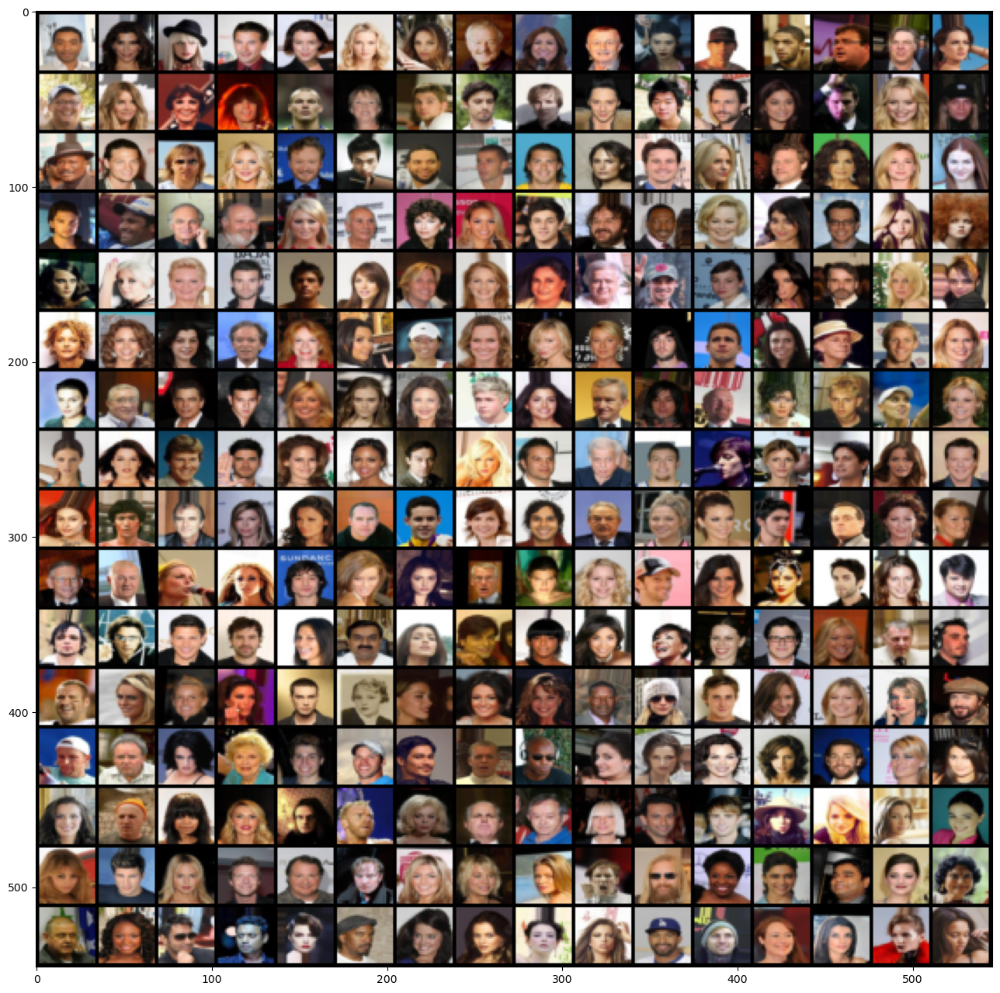

In [4]:
def imshow(img):
    plt.figure(figsize=(figsize,figsize))
    plt.imshow(img.cpu().permute(1, 2, 0).numpy())
    plt.show()

# Get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# Show images
imshow(torchvision.utils.make_grid(images, nrow=16))

In [5]:
images[0].shape

torch.Size([3, 32, 32])

In [6]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(3, 128, 3, 2, 1)
        self.bn1 = nn.BatchNorm2d(128)
        self.leaky_relu1 = nn.LeakyReLU()

        self.conv2 = nn.Conv2d(128, 128, 3, 2, 1)
        self.bn2 = nn.BatchNorm2d(128)
        self.leaky_relu2 = nn.LeakyReLU()

        self.conv3 = nn.Conv2d(128, 128, 3, 2, 1)
        self.bn3 = nn.BatchNorm2d(128)
        self.leaky_relu3 = nn.LeakyReLU()
        
        self.conv4 = nn.Conv2d(128, 128, 3, 2, 1)
        self.bn4 = nn.BatchNorm2d(128)
        self.leaky_relu4 = nn.LeakyReLU()
        
        self.flatten = nn.Flatten()
        self.mean = nn.Linear(512, 200)
        self.logvar = nn.Linear(512, 200)

    def reparameterize(self, mean, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mean + eps * std

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.leaky_relu1(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.leaky_relu2(x)

        x = self.conv3(x)
        x = self.bn3(x)
        x = self.leaky_relu3(x)
        
        x = self.conv4(x)
        x = self.bn4(x)
        x = self.leaky_relu4(x)
        
        x = self.flatten(x)
        mean = self.mean(x)
        logvar = self.logvar(x)
        z = self.reparameterize(mean, logvar)
        return z, mean, logvar


In [7]:
encoder = Encoder().cuda()
summary(encoder, (batch_size, 3, 32, 32))

Layer (type:depth-idx)                   Output Shape              Param #
Encoder                                  [256, 200]                --
├─Conv2d: 1-1                            [256, 128, 16, 16]        3,584
├─BatchNorm2d: 1-2                       [256, 128, 16, 16]        256
├─LeakyReLU: 1-3                         [256, 128, 16, 16]        --
├─Conv2d: 1-4                            [256, 128, 8, 8]          147,584
├─BatchNorm2d: 1-5                       [256, 128, 8, 8]          256
├─LeakyReLU: 1-6                         [256, 128, 8, 8]          --
├─Conv2d: 1-7                            [256, 128, 4, 4]          147,584
├─BatchNorm2d: 1-8                       [256, 128, 4, 4]          256
├─LeakyReLU: 1-9                         [256, 128, 4, 4]          --
├─Conv2d: 1-10                           [256, 128, 2, 2]          147,584
├─BatchNorm2d: 1-11                      [256, 128, 2, 2]          256
├─LeakyReLU: 1-12                        [256, 128, 2, 2]      

In [8]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()        
        self.fc = nn.Linear(200, 512)
        self.bn = nn.BatchNorm1d(512)
        self.leaky_relu = nn.LeakyReLU()
        
        self.unflatten = nn.Unflatten(1, (128 , 2 , 2))

        self.convt1 = nn.ConvTranspose2d(128, 128, 3, 2, 1, 1)
        self.bn1 = nn.BatchNorm2d(128)
        self.leaky_relu1 = nn.LeakyReLU()

        self.convt2 = nn.ConvTranspose2d(128, 128, 3, 2, 1, 1)
        self.bn2 = nn.BatchNorm2d(128)
        self.leaky_relu2 = nn.LeakyReLU()

        self.convt3 = nn.ConvTranspose2d(128, 128, 3, 2, 1, 1)
        self.bn3 = nn.BatchNorm2d(128)
        self.leaky_relu3 = nn.LeakyReLU()

        self.convt4 = nn.ConvTranspose2d(128, 128, 3, 2, 1, 1)
        self.bn4 = nn.BatchNorm2d(128)
        self.leaky_relu4 = nn.LeakyReLU()

        self.convt5 = nn.ConvTranspose2d(128, 3, 3, 1, 1)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        x = self.fc(x)
        x = self.bn(x)
        x = self.leaky_relu(x)

        x = self.unflatten(x)
        
        x = self.convt1(x)
        x = self.bn1(x)
        x = self.leaky_relu1(x)

        x = self.convt2(x)
        x = self.bn2(x)
        x = self.leaky_relu2(x)
        
        x = self.convt3(x)
        x = self.bn3(x)
        x = self.leaky_relu3(x)

        x = self.convt4(x)
        x = self.bn4(x)
        x = self.leaky_relu4(x)

        x = self.convt5(x)
        x = self.sigmoid(x)
        return x

In [9]:
decoder = Decoder().cuda()
summary(decoder, (batch_size, 200))

Layer (type:depth-idx)                   Output Shape              Param #
Decoder                                  [256, 3, 32, 32]          --
├─Linear: 1-1                            [256, 512]                102,912
├─BatchNorm1d: 1-2                       [256, 512]                1,024
├─LeakyReLU: 1-3                         [256, 512]                --
├─Unflatten: 1-4                         [256, 128, 2, 2]          --
├─ConvTranspose2d: 1-5                   [256, 128, 4, 4]          147,584
├─BatchNorm2d: 1-6                       [256, 128, 4, 4]          256
├─LeakyReLU: 1-7                         [256, 128, 4, 4]          --
├─ConvTranspose2d: 1-8                   [256, 128, 8, 8]          147,584
├─BatchNorm2d: 1-9                       [256, 128, 8, 8]          256
├─LeakyReLU: 1-10                        [256, 128, 8, 8]          --
├─ConvTranspose2d: 1-11                  [256, 128, 16, 16]        147,584
├─BatchNorm2d: 1-12                      [256, 128, 16, 16] 

In [10]:
class Vae(nn.Module):
    def __init__(self):
        super(Vae, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        z, mean, logvar = self.encoder(x)
        x = self.decoder(z)
        return x, z, mean, logvar


In [11]:
model = Vae().cuda()
summary(model, (batch_size, 3, 32, 32))

Layer (type:depth-idx)                   Output Shape              Param #
Vae                                      [256, 3, 32, 32]          --
├─Encoder: 1-1                           [256, 200]                --
│    └─Conv2d: 2-1                       [256, 128, 16, 16]        3,584
│    └─BatchNorm2d: 2-2                  [256, 128, 16, 16]        256
│    └─LeakyReLU: 2-3                    [256, 128, 16, 16]        --
│    └─Conv2d: 2-4                       [256, 128, 8, 8]          147,584
│    └─BatchNorm2d: 2-5                  [256, 128, 8, 8]          256
│    └─LeakyReLU: 2-6                    [256, 128, 8, 8]          --
│    └─Conv2d: 2-7                       [256, 128, 4, 4]          147,584
│    └─BatchNorm2d: 2-8                  [256, 128, 4, 4]          256
│    └─LeakyReLU: 2-9                    [256, 128, 4, 4]          --
│    └─Conv2d: 2-10                      [256, 128, 2, 2]          147,584
│    └─BatchNorm2d: 2-11                 [256, 128, 2, 2]       

In [12]:
def loss_function(y, x, mean, logvar):
    bce_loss = F.binary_cross_entropy(y, x, reduction='sum')
    
    # KL divergence
    kld_loss = -0.5 * torch.sum(1 + logvar - mean.pow(2) - logvar.exp())
    
    return bce_loss + kld_loss, bce_loss, kld_loss

In [13]:
optimizer = optim.Adam(model.parameters(), lr=0.001)
writer = SummaryWriter()

In [14]:
%%script true

num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    batch_idx = 0
    for imgs, labels in train_loader:
        imgs, labels = imgs.cuda(), labels.cuda()    
        y, z, mean, logvar = model(imgs)
        total_loss, bce_loss, kld_loss = loss_function(y, imgs, mean, logvar)

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        train_loss += total_loss.item()
        writer.add_scalar('Total Loss', total_loss.item(), batch_idx)
        writer.add_scalar('BCE Loss', bce_loss.item(), batch_idx)
        writer.add_scalar('KLD Loss', kld_loss.item(), batch_idx)
        batch_idx += 1

    model.eval()
    with torch.no_grad():
        sample = torch.randn(64, 200).cuda()
        generated_images = model.decoder(sample)
        grid = torchvision.utils.make_grid(generated_images, nrow=8)
        writer.add_image('VAE Generated Images', grid, epoch)
    avg_loss = train_loss / len(train_loader.dataset)
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}')
writer.close()
save_model(model, "data/vae_faces.safetensors")

In [15]:
load_model(model, "data/vae_faces.safetensors", device="cuda")

(set(), [])

In [16]:
test_loader = DataLoader(test_dataset, batch_size, shuffle=False)
test_x, test_label = next(iter(test_loader))
test_x = test_x.cuda()
with torch.no_grad():
    test_y, z, mean, logvar = model(test_x)

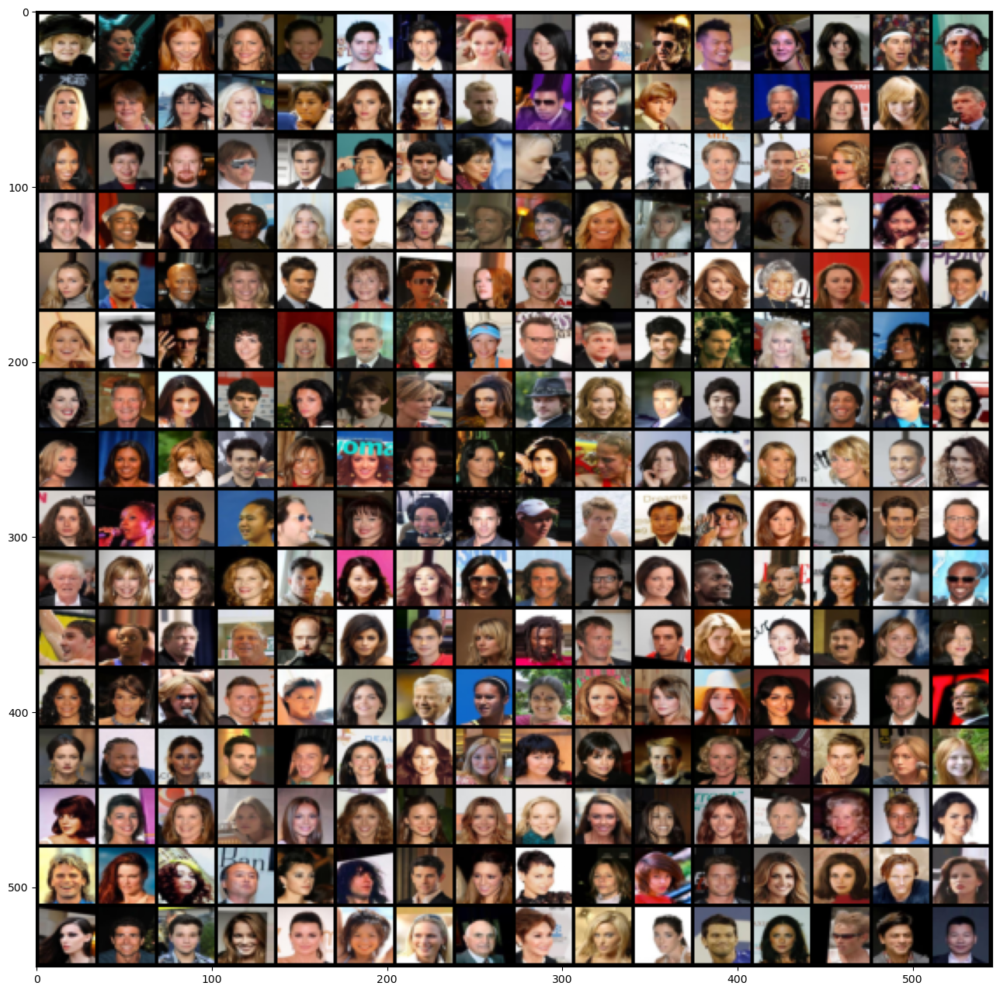

In [17]:
imshow(torchvision.utils.make_grid(test_x, nrow=16))

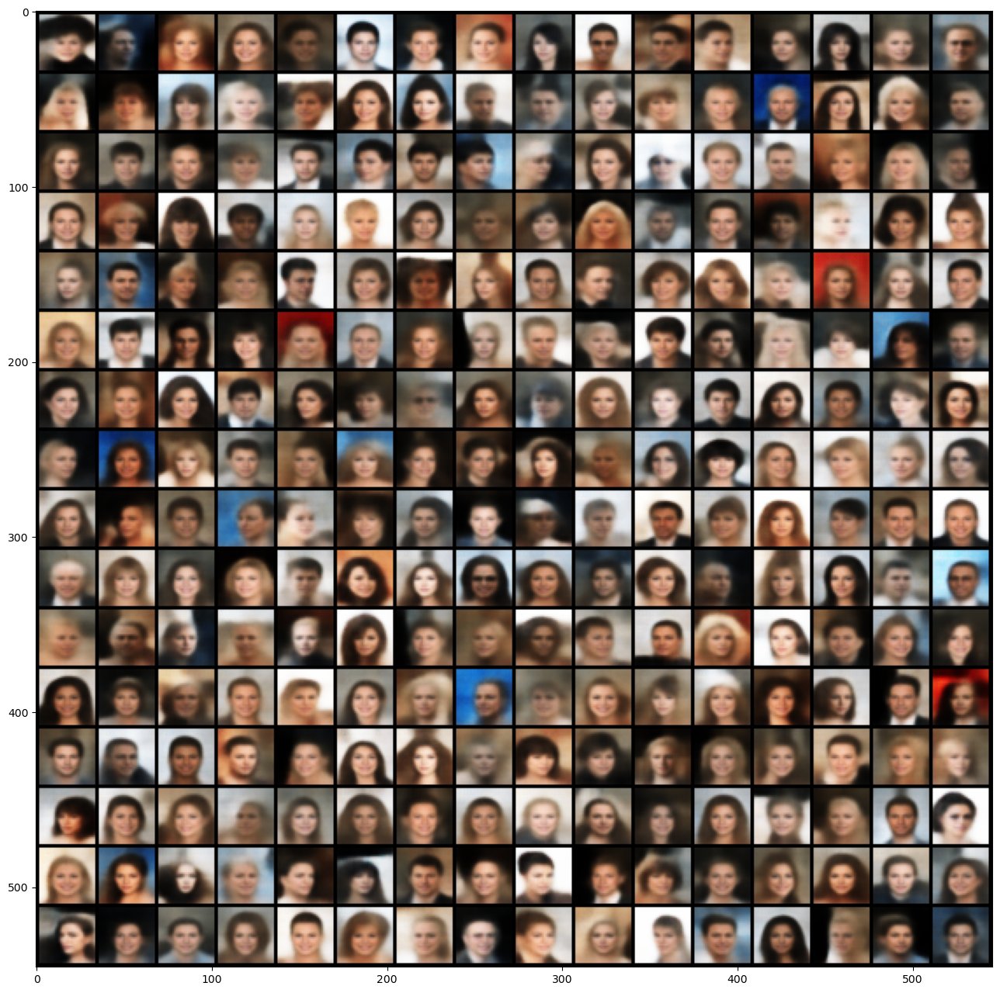

In [18]:
imshow(torchvision.utils.make_grid(test_y, nrow=16))

In [19]:
with torch.no_grad():
    z, mean, logvar = model.encoder(test_x)

In [20]:
z = z.cpu()

In [21]:
z[:, 1].shape

torch.Size([256])

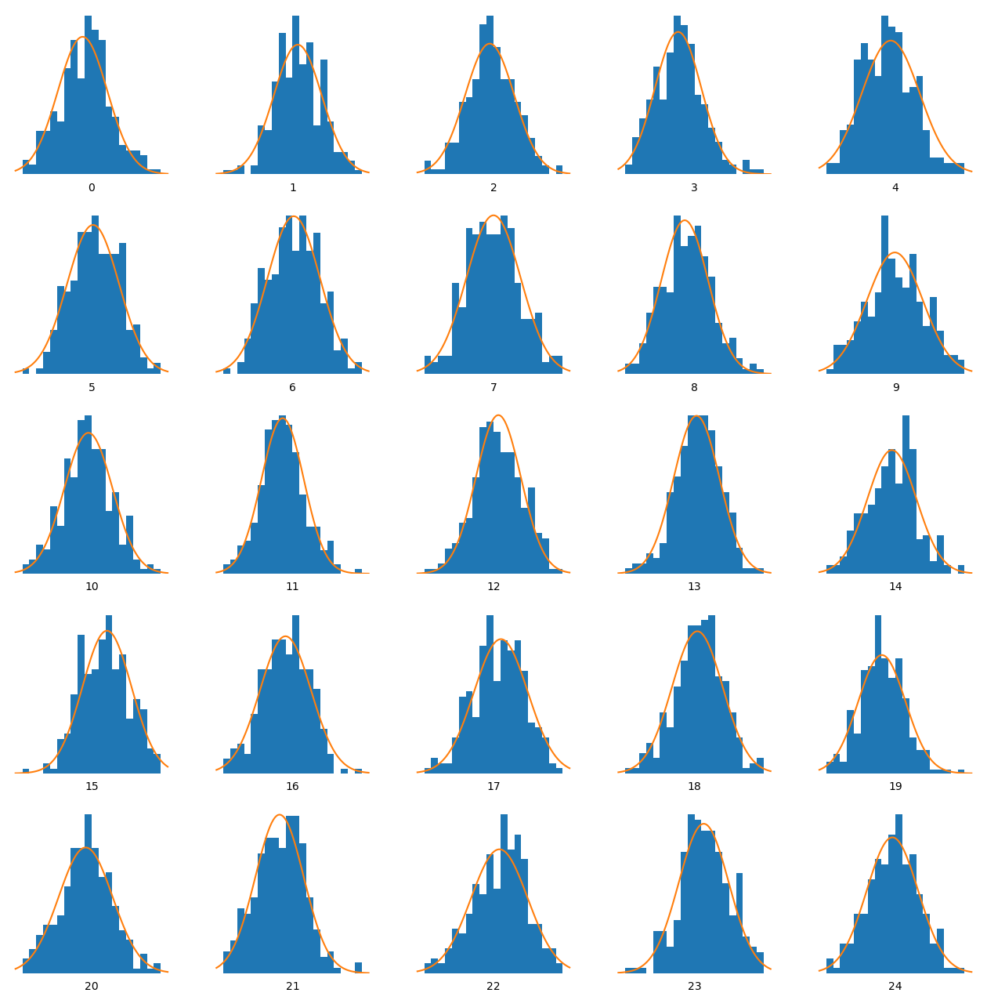

In [22]:
fig = plt.figure(figsize=(figsize, figsize))
from torch.distributions import Normal

# Define the mean and standard deviation of the normal distribution
mean = 0.0
std_dev = 1.0

# Create the normal distribution
normal_dist = Normal(loc=mean, scale=std_dev)

# Evaluate the PDF
for i in range(25):
    ax = fig.add_subplot(5, 5, i + 1)
    ax.hist(z[:, i].numpy(), 20, density=True)
    ax.axis("off")
    ax.text(0.5, -0.1, str(i), fontsize=10, ha="center", transform=ax.transAxes)
    xmin, xmax = plt.xlim()
    x = torch.linspace(xmin, xmax, 100)
    p = normal_dist.log_prob(x).exp()
    # Plot the normal distribution curve
    plt.plot(x, p)



In [23]:
df = pd.read_csv("data/celeba/list_attr_celeba.txt", sep="\s+", header=1)

In [24]:
df.columns

Index(['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes',
       'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair',
       'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin',
       'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones',
       'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard',
       'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
       'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair',
       'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick',
       'Wearing_Necklace', 'Wearing_Necktie', 'Young'],
      dtype='object')

In [25]:
df.head()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


Files already downloaded and verified
0 5_o_Clock_Shadow


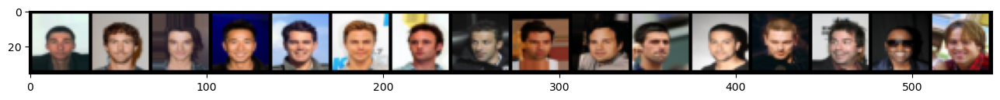

1 Arched_Eyebrows


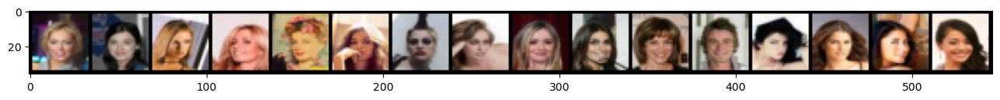

2 Attractive


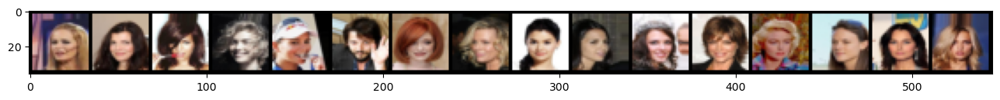

3 Bags_Under_Eyes


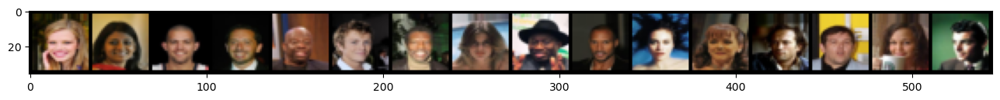

4 Bald


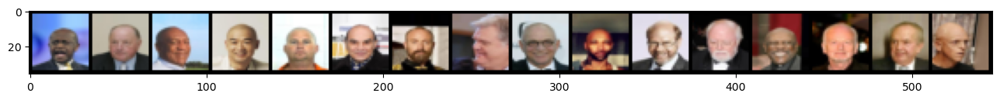

5 Bangs


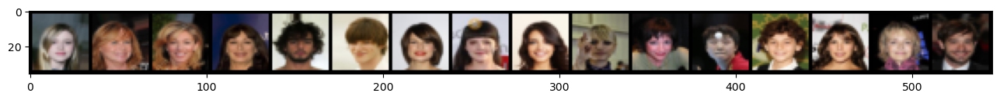

6 Big_Lips


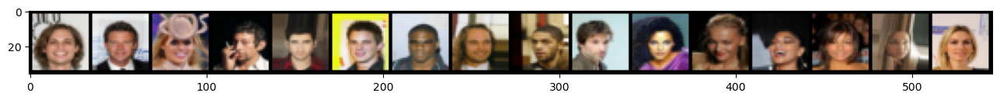

7 Big_Nose


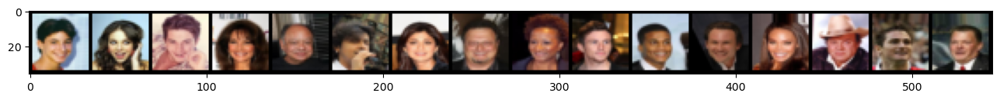

8 Black_Hair


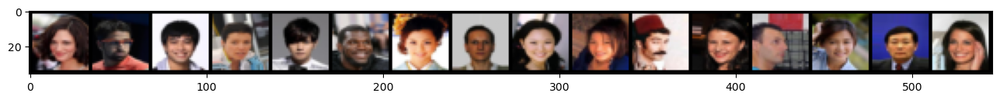

9 Blond_Hair


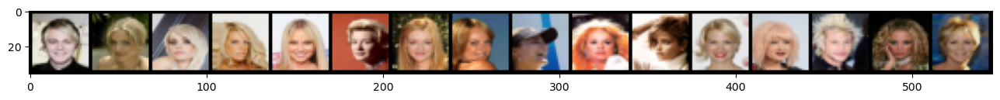

10 Blurry


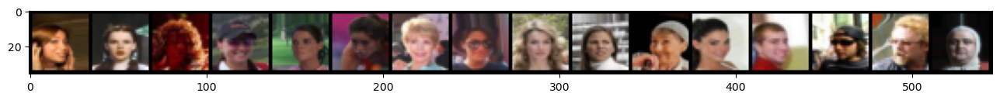

11 Brown_Hair


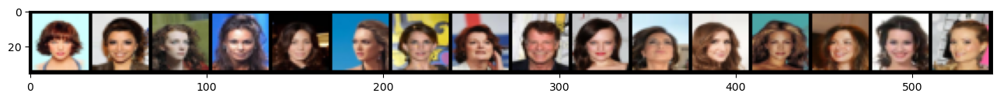

12 Bushy_Eyebrows


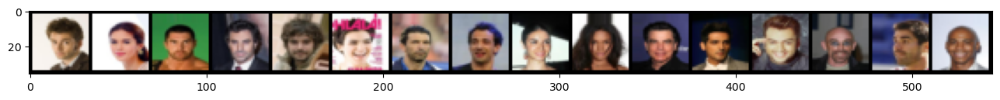

13 Chubby


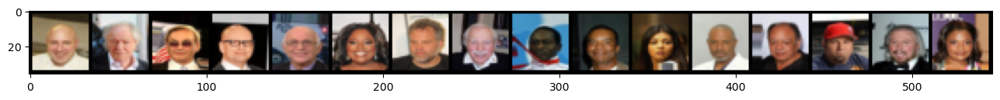

14 Double_Chin


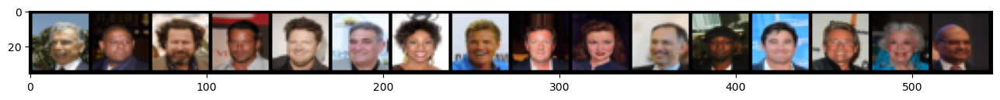

15 Eyeglasses


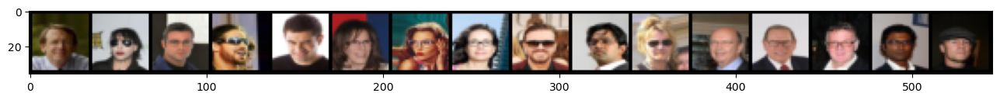

16 Goatee


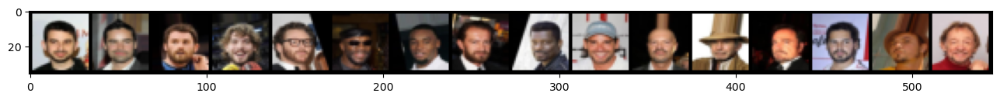

17 Gray_Hair


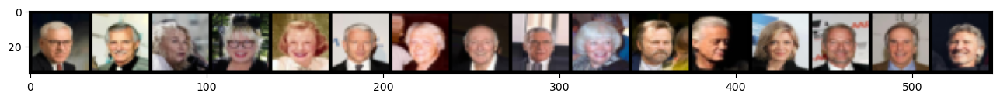

18 Heavy_Makeup


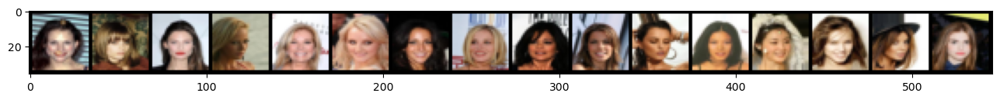

19 High_Cheekbones


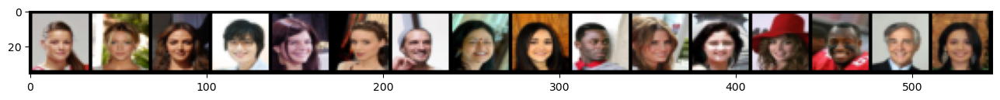

20 Male


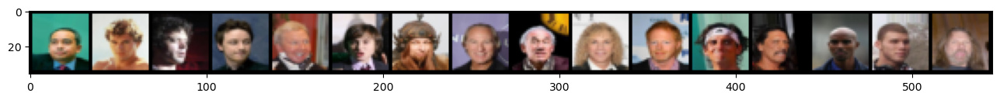

21 Mouth_Slightly_Open


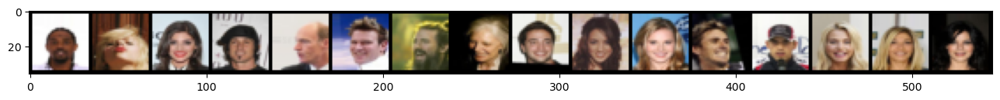

22 Mustache


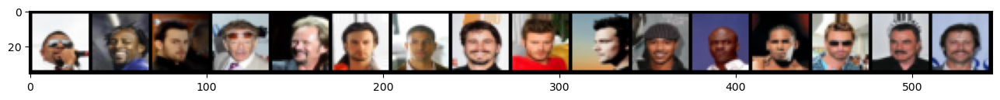

23 Narrow_Eyes


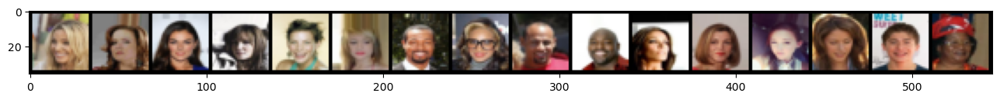

24 No_Beard


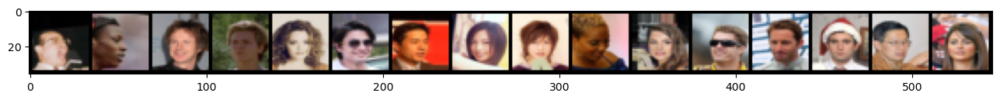

25 Oval_Face


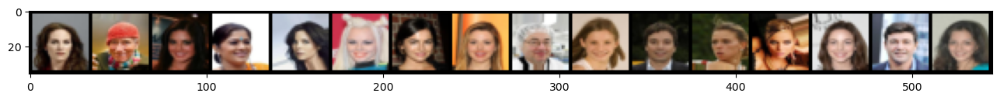

26 Pale_Skin


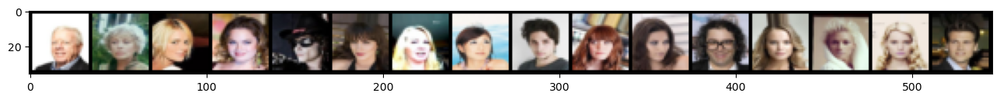

27 Pointy_Nose


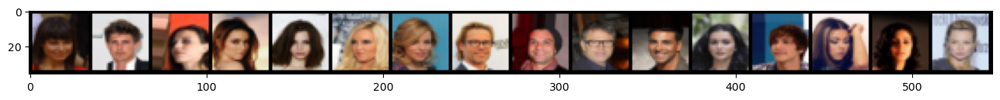

28 Receding_Hairline


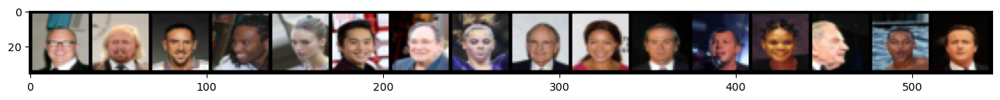

29 Rosy_Cheeks


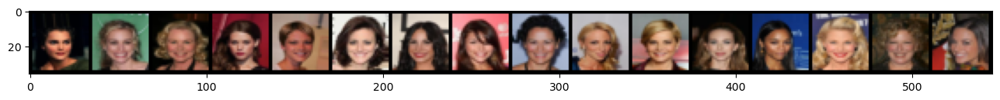

30 Sideburns


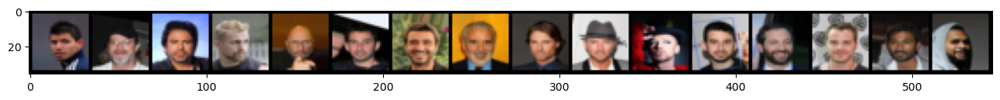

31 Smiling


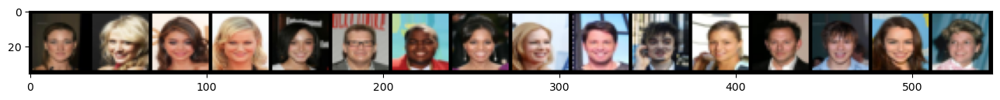

32 Straight_Hair


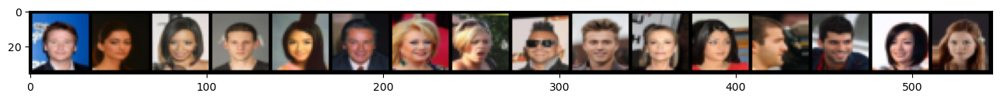

33 Wavy_Hair


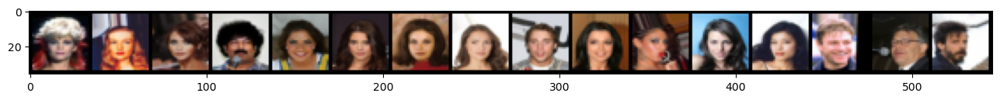

34 Wearing_Earrings


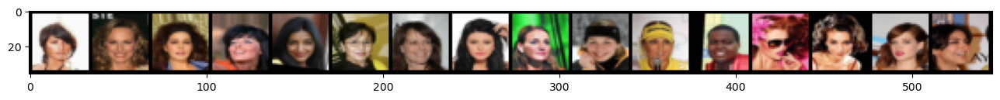

35 Wearing_Hat


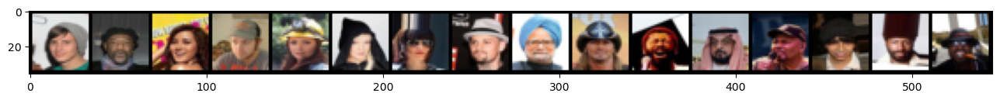

36 Wearing_Lipstick


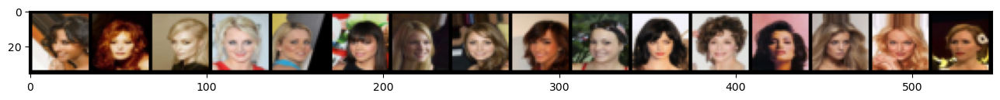

37 Wearing_Necklace


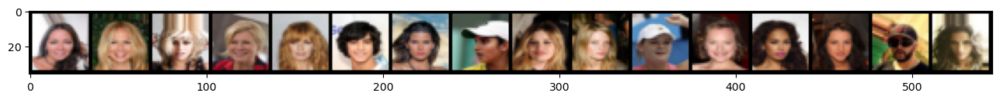

38 Wearing_Necktie


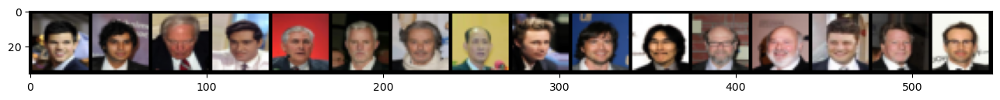

39 Young


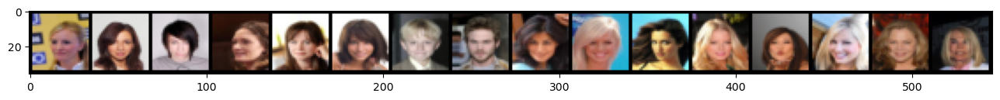

In [26]:
all_dataset = torchvision.datasets.CelebA(
    root='./data',  # Directory where the dataset will be saved
    split='all',  # Choose 'train', 'valid', or 'test'
    target_type='attr',  # Attributes to download
    transform=transform,  # Transform to apply to images
    download=True  # Download the dataset if not already present
)

for i in range(40):
    subset_indexes = (all_dataset.attr[:,i]).nonzero().squeeze()
    subset = Subset(all_dataset, subset_indexes)
    subset_loader = DataLoader(subset, batch_size=16, shuffle=True)
    
    dataiter = iter(subset_loader)
    images, labels = next(dataiter)
    
    # Show images
    print(i, df.columns[i])
    imshow(torchvision.utils.make_grid(images, nrow=16))

In [27]:
def get_vector_from_label(dataset, batch_size, dim, label):
    cur_sum_pos = torch.zeros(dim).cuda()
    cur_mean_pos = torch.zeros(dim).cuda()
    new_mean_pos = torch.zeros(dim).cuda()
    n_pos = 0
    movement_pos = .0
    
    cur_sum_neg = torch.zeros(dim).cuda()
    cur_mean_neg = torch.zeros(dim).cuda()
    new_mean_neg = torch.zeros(dim).cuda()
    n_neg = 0
    movement_neg = .0
    
    cur_vector = torch.zeros(dim).cuda()
    cur_dist = 0
    
    for imgs, labels in DataLoader(all_dataset, batch_size):
        imgs = imgs.cuda()
        labels = labels.cuda()
        with torch.no_grad():
            z, _, _ = model.encoder(imgs)
        pos = labels[:,label].nonzero().squeeze(1)
        neg = (1-labels[:,label]).nonzero().squeeze(1)
        if len(pos) > 0:
            cur_sum_pos += z[pos].sum(dim=0)
            n_pos += len(pos)
            new_mean_pos = cur_sum_pos / n_pos
            movement_pos = torch.norm(new_mean_pos - cur_mean_pos)
        if len(neg) > 0:
            cur_sum_neg += z[neg].sum(dim=0)
            n_neg += len(neg)
            new_mean_neg = cur_sum_neg / n_neg
            movement_neg = torch.norm(new_mean_neg - cur_mean_neg)
        cur_vector = new_mean_pos - new_mean_neg
        new_dist = torch.norm(cur_vector)
        dist_change = new_dist - cur_dist
        print(f"{movement_pos:.3} {movement_neg:.3} {new_dist:.3} {dist_change:.3}")
        
        cur_mean_pos = new_mean_pos
        cur_mean_neg = new_mean_neg
        cur_dist = new_dist
    
        if movement_pos + movement_neg < 0.08:
            break
    return cur_vector / cur_dist
    
    

In [28]:
blond_vector = get_vector_from_label(all_dataset, batch_size, 200, 9)

2.62 0.921 2.78 2.78
1.74 0.601 2.14 -0.642
0.936 0.369 1.89 -0.246
0.748 0.247 1.79 -0.0997
0.535 0.204 1.72 -0.0766
0.457 0.161 1.62 -0.0987
0.339 0.147 1.57 -0.0441
0.325 0.116 1.56 -0.0103
0.246 0.117 1.56 -0.00478
0.223 0.089 1.55 -0.011
0.191 0.0933 1.53 -0.0131
0.204 0.0769 1.53 -0.00401
0.173 0.0704 1.51 -0.0253
0.163 0.0725 1.51 0.00629
0.173 0.0621 1.51 -1.19e-07
0.143 0.0557 1.51 -0.00404
0.144 0.0572 1.5 -0.00647
0.109 0.0602 1.48 -0.0194
0.133 0.0477 1.47 -0.00747
0.107 0.0484 1.47 -0.00777
0.104 0.0461 1.48 0.0112
0.11 0.0443 1.47 -0.00685
0.11 0.037 1.46 -0.0138
0.0916 0.0387 1.46 -0.000335
0.109 0.0377 1.45 -0.00265
0.0847 0.0381 1.45 -0.00725
0.0846 0.0334 1.45 0.00349
0.0699 0.0354 1.45 0.00332
0.0847 0.0324 1.45 -0.0067
0.0648 0.0307 1.44 -0.00686
0.0668 0.0258 1.44 -0.00276
0.074 0.0312 1.43 -0.00669
0.0746 0.0284 1.42 -0.0143
0.0615 0.0284 1.41 -0.00211
0.0564 0.0255 1.41 -0.00364
0.0626 0.0277 1.4 -0.00769
0.0671 0.0252 1.4 -0.000148
0.0682 0.0236 1.39 -0.00937
0.

In [29]:
torch.norm(blond_vector)

tensor(1.0000, device='cuda:0')

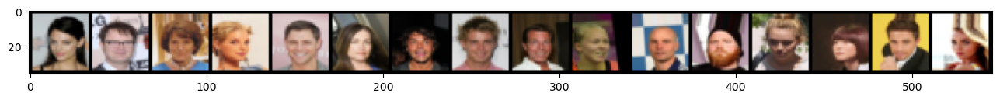

<Figure size 1600x1600 with 0 Axes>

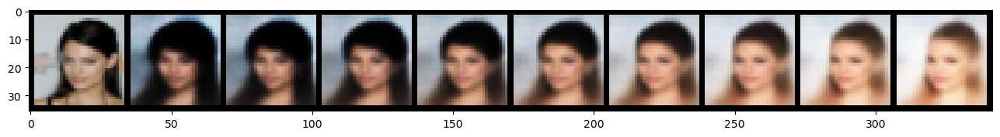

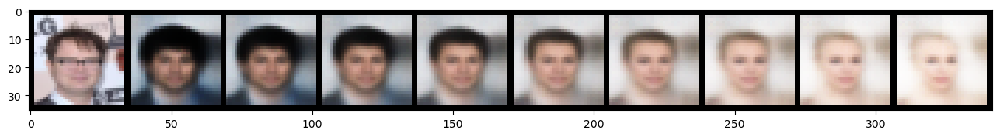

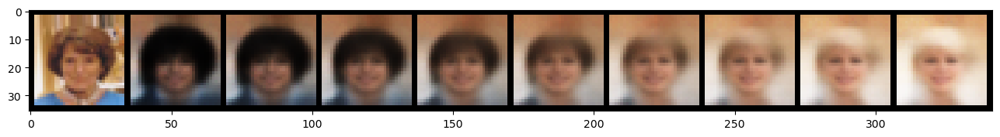

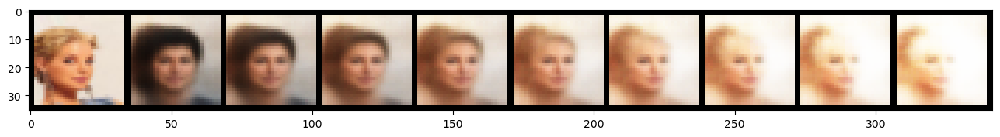

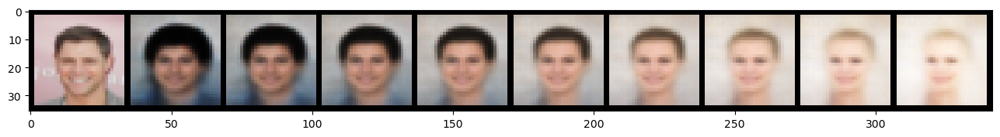

...

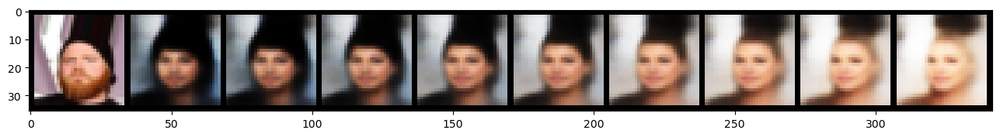

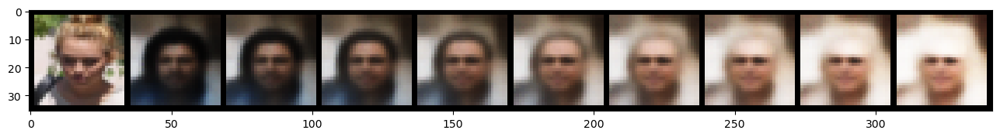

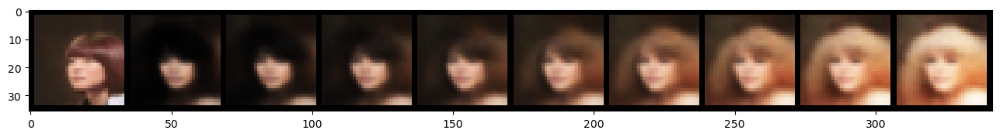

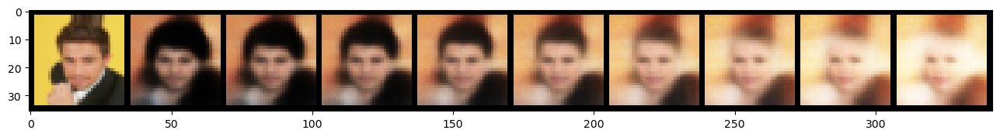

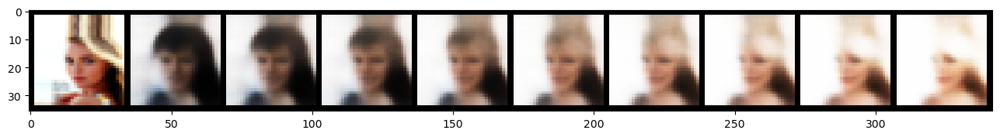

In [30]:
batch_size = 16
test_loader = DataLoader(test_dataset, batch_size, shuffle=True)
test_x, test_label = next(iter(test_loader))
test_x = test_x.cuda()
factors = [-4, -3, -2, -1, 0, 1, 2, 3, 4]
imshow(torchvision.utils.make_grid(test_x, nrow=16))

fig = plt.figure(figsize=(figsize,figsize))
counter = 1
model.eval()
with torch.no_grad():
    z, mean, logvar = model.encoder(test_x)
    for i in range(batch_size):
        row = []
        img = test_x[i]
        row.append(img)
        for j in range(9):
            factor = factors[j]
            z_changed = z[i] + blond_vector * factor
            z_changed = z_changed.unsqueeze(0)
            y_changed = model.decoder(z_changed)
            y_changed = y_changed.squeeze()
            row.append(y_changed)
        imshow(torchvision.utils.make_grid(row, nrow=16))
    

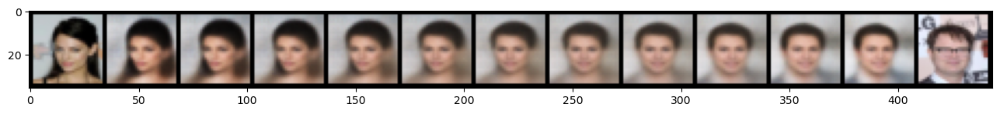

In [31]:
morphs = []
morphs.append(test_x[0])
model.eval()
with torch.no_grad():
    z, _, _ = model.encoder(test_x[:2])
    for factor in torch.arange(11):
        a = (10 - factor)/10
        b = factor/ 10
        m = z[0] * a + z[1] * b
        m = m.unsqueeze(0)
        y = model.decoder(m)
        morphs.append(y.squeeze(0))
morphs.append(test_x[1])
imshow(torchvision.utils.make_grid(morphs, nrow=16))
